##Importing all the libraries

In [1]:
!pip install scikit-learn


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install scikit-learn flask seaborn matplotlib numpy pandas




[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from flask import Flask, render_template, request
from sklearn.neural_network import MLPRegressor


In [4]:
def posix_time(dt):
    return (dt - datetime(1970, 1, 1)) / timedelta(seconds=1)



#importing the dataset




In [5]:
data = pd.read_csv('traffic_volume_data.csv')

Some Exploratory data analysis 

In [6]:
# Display the first few rows of the dataset
data.head()

,date_time,is_holiday,air_pollution_index,humidity,wind_speed,wind_direction,visibility_in_miles,dew_point,temperature,rain_p_h,...,last_2_hour_traffic,last_3_hour_traffic,last_4_hour_traffic,last_5_hour_traffic,last_6_hour_traffic,hour,month_day,weekday,month,year
0,2012-10-04 07:00:00,1,142,47,4,350,2,2,280.57,0.0,...,2726.0,835.0,367.0,312.0,369.0,7,4,4,10,2012
1,2012-10-04 08:00:00,1,90,50,4,360,5,5,281.86,0.0,...,5689.0,2726.0,835.0,367.0,312.0,8,4,4,10,2012
2,2012-10-04 09:00:00,1,144,75,0,0,6,6,284.98,0.0,...,6990.0,5689.0,2726.0,835.0,367.0,9,4,4,10,2012
3,2012-10-04 10:00:00,1,143,57,0,0,8,8,289.18,0.0,...,5985.0,6990.0,5689.0,2726.0,835.0,10,4,4,10,2012
4,2012-10-04 11:00:00,1,61,70,1,320,1,1,291.55,0.0,...,5309.0,5985.0,6990.0,5689.0,2726.0,11,4,4,10,2012


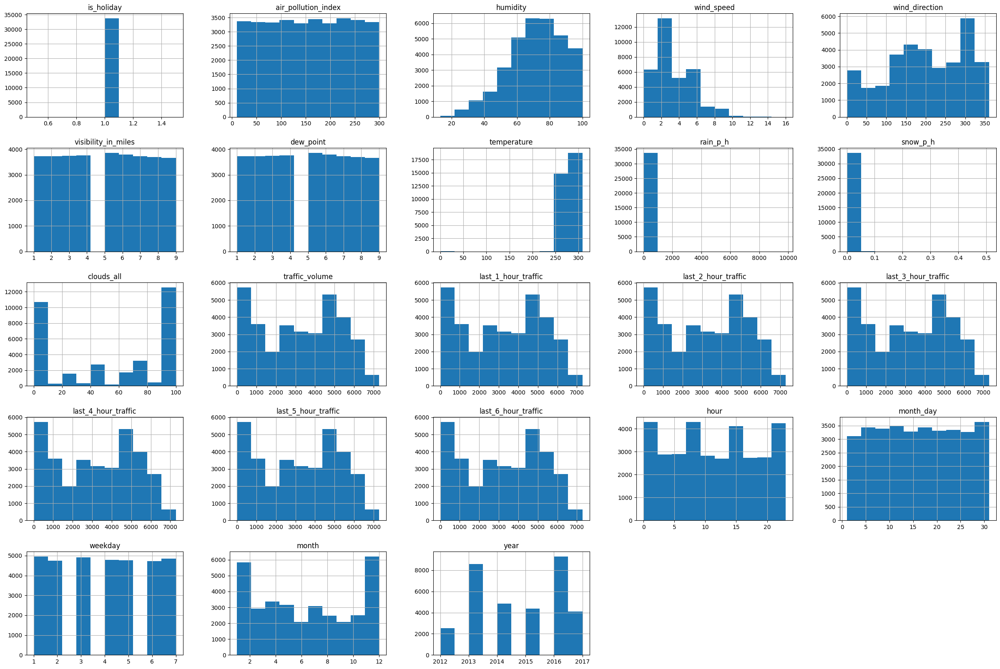

In [7]:
data.hist(figsize=(30, 20))
plt.show()

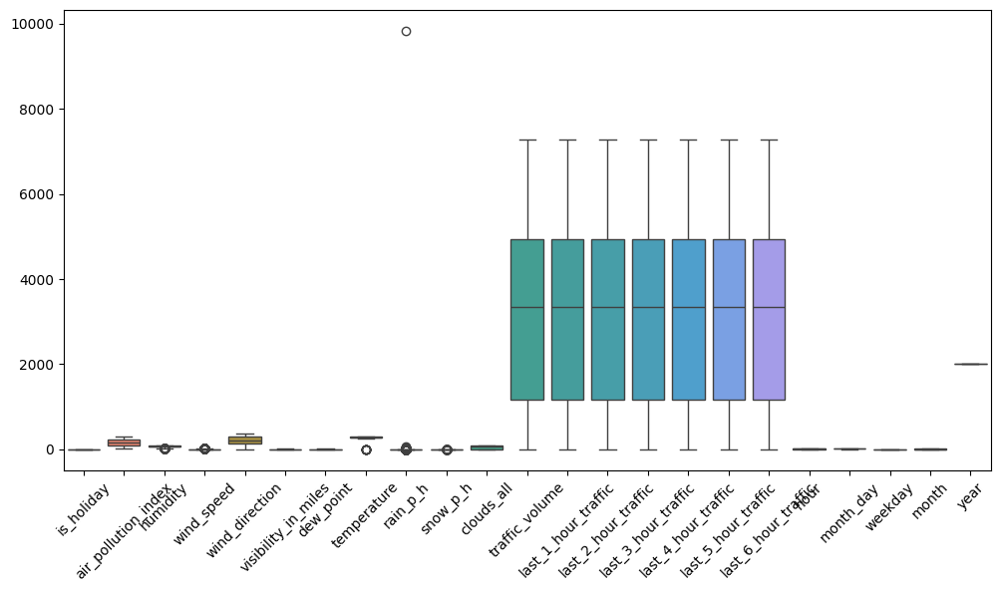

In [8]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=data)
plt.xticks(rotation=45)
plt.show()

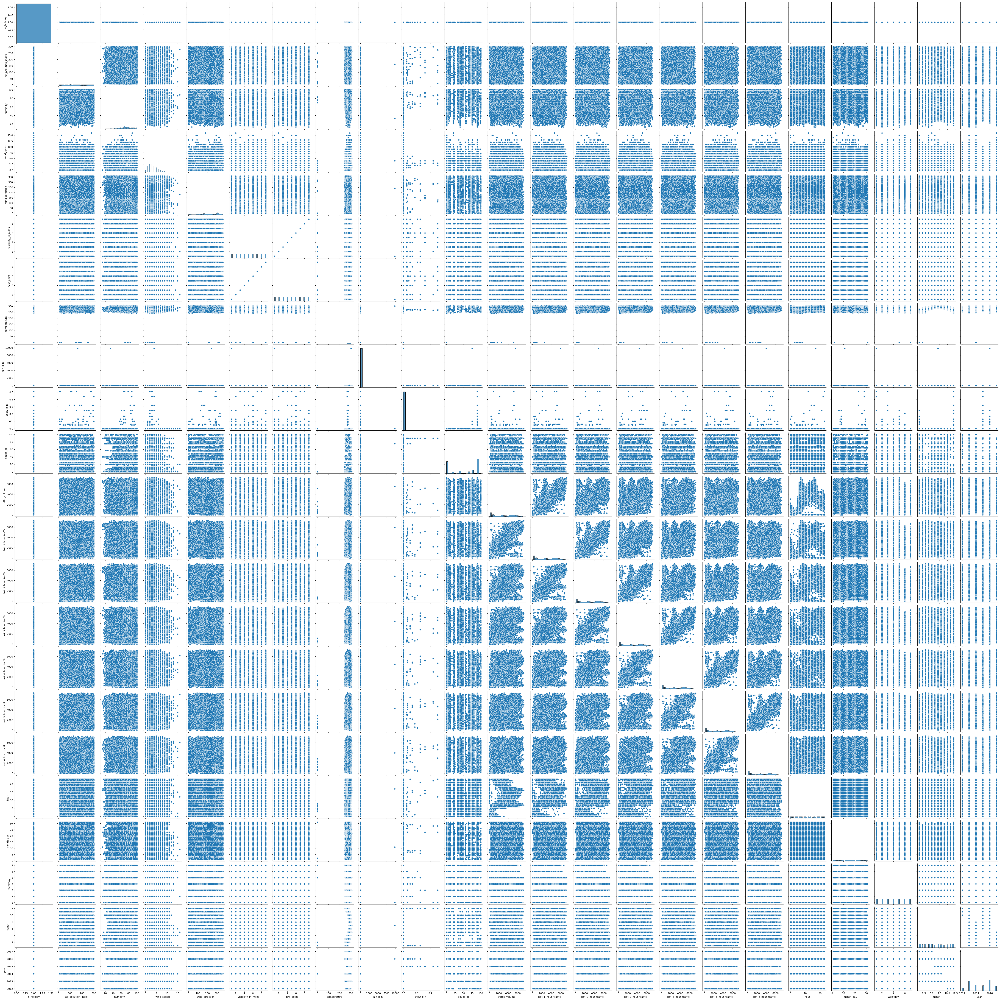

In [9]:
sns.pairplot(data)
plt.show()

#taking the required features or columns
Collecting the data


In [10]:
data = data.sort_values(
    by=['date_time'], ascending=True).reset_index(drop=True)
last_n_hours = [1, 2, 3, 4, 5, 6]
for n in last_n_hours:
    data[f'last_{n}_hour_traffic'] = data['traffic_volume'].shift(n)
data = data.dropna().reset_index(drop=True)
data.loc[data['is_holiday'] != 'None', 'is_holiday'] = 1
data.loc[data['is_holiday'] == 'None', 'is_holiday'] = 0
data['is_holiday'] = data['is_holiday'].astype(int)

data['date_time'] = pd.to_datetime(data['date_time'])
data['hour'] = data['date_time'].map(lambda x: int(x.strftime("%H")))
data['month_day'] = data['date_time'].map(lambda x: int(x.strftime("%d")))
data['weekday'] = data['date_time'].map(lambda x: x.weekday()+1)
data['month'] = data['date_time'].map(lambda x: int(x.strftime("%m")))
data['year'] = data['date_time'].map(lambda x: int(x.strftime("%Y")))
data.to_csv("traffic_volume_data.csv", index=None)

In [11]:
sns.set()
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False
warnings.filterwarnings('ignore')
data = pd.read_csv("traffic_volume_data.csv")
data = data.sample(10000).reset_index(drop=True)
label_columns = ['weather_type', 'weather_description']
numeric_columns = ['is_holiday', 'temperature',
                       'weekday', 'hour', 'month_day', 'year', 'month']

In [12]:
features = numeric_columns+label_columns
X = data[features]
X.head()

,is_holiday,temperature,weekday,hour,month_day,year,month,weather_type,weather_description
0,1,258.33,3,1,22,2014,1,Snow,light snow
1,1,261.19,7,13,2,2014,2,Clear,sky is clear
2,1,281.48,2,23,2,2017,5,Clouds,scattered clouds
3,1,300.11,2,19,28,2015,7,Clouds,scattered clouds
4,1,288.78,6,3,9,2016,7,Mist,mist


In [13]:
X.shape


(10000, 9)

In [14]:
from functools import reduce
def unique(list1):
    ans = reduce(lambda re, x: re+[x] if x not in re else re, list1, [])
    print(ans)

n1 = data['weather_type']
n2 = data['weather_description']
unique(n1)
unique(n2)
n1features = ['Rain', 'Clouds', 'Clear', 'Snow', 'Mist',
              'Drizzle', 'Haze', 'Thunderstorm', 'Fog', 'Smoke', 'Squall']
n2features = ['light rain', 'few clouds', 'Sky is Clear', 'light snow', 'sky is clear', 'mist', 'broken clouds', 'moderate rain', 'drizzle', 'overcast clouds', 'scattered clouds', 'haze', 'proximity thunderstorm', 'light intensity drizzle', 'heavy snow', 'heavy intensity rain', 'fog', 'heavy intensity drizzle', 'shower snow', 'snow', 'thunderstorm with rain',
              'thunderstorm with heavy rain', 'thunderstorm with light rain', 'proximity thunderstorm with rain', 'thunderstorm with drizzle', 'smoke', 'thunderstorm', 'proximity shower rain', 'very heavy rain', 'proximity thunderstorm with drizzle', 'light rain and snow', 'light intensity shower rain', 'SQUALLS', 'shower drizzle', 'thunderstorm with light drizzle']
"""#Data Preparation"""

n11 = []
n22 = []
for i in range(10000):
    if(n1[i]) not in n1features:
        n11.append(0)
    else:
        n11.append((n1features.index(n1[i]))+1)
    if n2[i] not in n2features:
        n22.append(0)
    else:
        n22.append((n2features.index(n2[i]))+1)
# print(n11)
# print(n22)
data['weather_type'] = n11
data['weather_description'] = n22


['Snow', 'Clear', 'Clouds', 'Mist', 'Rain', 'Haze', 'Drizzle', 'Fog', 'Thunderstorm', 'Squall', 'Smoke']
['light snow', 'sky is clear', 'scattered clouds', 'mist', 'moderate rain', 'haze', 'overcast clouds', 'few clouds', 'heavy intensity rain', 'Sky is Clear', 'light intensity drizzle', 'broken clouds', 'light rain', 'drizzle', 'snow', 'fog', 'thunderstorm', 'heavy snow', 'proximity thunderstorm', 'very heavy rain', 'SQUALLS', 'sleet', 'heavy intensity drizzle', 'smoke', 'proximity shower rain', 'thunderstorm with heavy rain', 'light rain and snow', 'thunderstorm with light rain', 'proximity thunderstorm with drizzle', 'proximity thunderstorm with rain', 'light shower snow', 'light intensity shower rain', 'thunderstorm with rain', 'shower snow']


#Data Preparation

In [15]:
features = numeric_columns+label_columns
target = ['traffic_volume']
X = data[features]
y = data[target]

In [16]:
X.head(6)

,is_holiday,temperature,weekday,hour,month_day,year,month,weather_type,weather_description
0,1,258.33,3,1,22,2014,1,4,4
1,1,261.19,7,13,2,2014,2,3,5
2,1,281.48,2,23,2,2017,5,2,11
3,1,300.11,2,19,28,2015,7,2,11
4,1,288.78,6,3,9,2016,7,5,6
5,1,274.01,7,1,25,2016,12,5,6


findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei


[[<Axes: title={'center': 'is_holiday'}>
  <Axes: title={'center': 'temperature'}>
  <Axes: title={'center': 'weekday'}>]
 [<Axes: title={'center': 'hour'}> <Axes: title={'center': 'month_day'}>
  <Axes: title={'center': 'year'}>]
 [<Axes: title={'center': 'month'}>
  <Axes: title={'center': 'weather_type'}>
  <Axes: title={'center': 'weather_description'}>]]


findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not foun

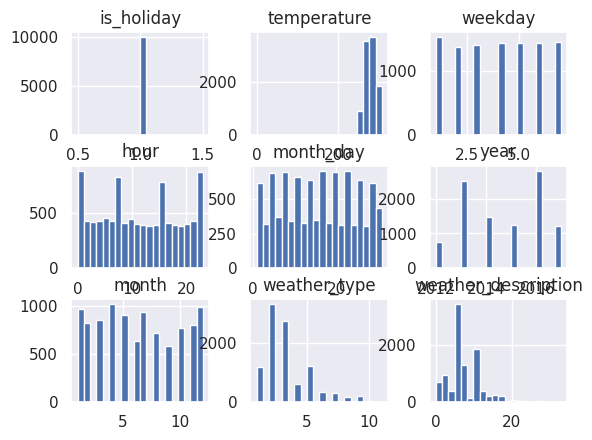

In [17]:
print(data[features].hist(bins=20,))

In [18]:
# data['traffic_volume'].hist(bins=20)

#Feature Scaling

In [19]:
x_scaler = MinMaxScaler()
X = x_scaler.fit_transform(X)
y_scaler = MinMaxScaler()
y = y_scaler.fit_transform(y).flatten()
warnings.filterwarnings('ignore')

In [20]:
print(X[:5])

[[0.         0.83808072 0.33333333 0.04347826 0.7        0.4
  0.         0.3        0.12121212]
 [0.         0.8473592  1.         0.56521739 0.03333333 0.4
  0.09090909 0.2        0.15151515]
 [0.         0.91318453 0.16666667 1.         0.03333333 1.
  0.36363636 0.1        0.33333333]
 [0.         0.97362445 0.16666667 0.82608696 0.9        0.6
  0.54545455 0.1        0.33333333]
 [0.         0.93686738 0.83333333 0.13043478 0.26666667 0.8
  0.54545455 0.4        0.18181818]]


#Visualization

findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not found because none of the following families were found: SimHei
findfont: Generic family 'sans-serif' not foun

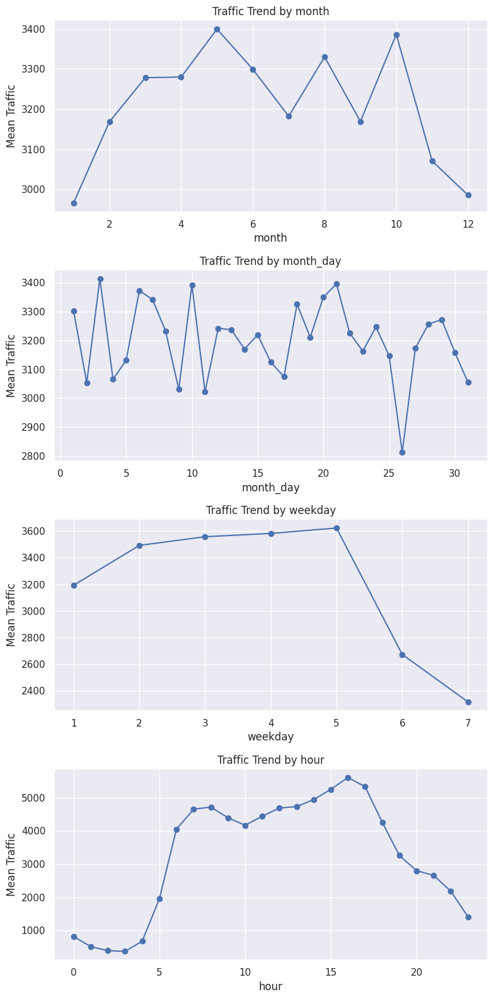

In [21]:
metrics = ['month', 'month_day', 'weekday', 'hour']
fig = plt.figure(figsize=(8, 4*len(metrics)))
for i, metric in enumerate(metrics):
	ax = fig.add_subplot(len(metrics), 1, i+1)
	ax.plot(data.groupby(metric)['traffic_volume'].mean(), '-o')
	ax.set_xlabel(metric)
	ax.set_ylabel("Mean Traffic")
	ax.set_title(f"Traffic Trend by {metric}")
plt.tight_layout()
plt.show()

#Train the Model

In [22]:
regr = MLPRegressor(random_state=1, max_iter=500).fit(X, y)
new = []
print('predicted output :=',regr.predict(X[:10]))
print('Actual output :=',y[:10])

predicted output := [0.0155349  0.51735194 0.20243072 0.54971254 0.02357582 0.1072804
 0.66405525 0.74038317 0.41973515 0.45200647]
Actual output := [0.04132231 0.52272727 0.18112948 0.44008264 0.06997245 0.09077135
 0.66294766 0.5969697  0.43677686 0.43498623]


In [23]:
# error eval
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
trainX, testX, trainY, testY = train_test_split(X, y, test_size=0.2)
y_pred = regr.predict(testX)
print('Mean Absolute Error:', mean_absolute_error(testY, y_pred))
print('Accuracy of model.', 1-mean_absolute_error(testY, y_pred))
##############################

Mean Absolute Error: 0.0727320931954353
Accuracy of model. 0.9272679068045647


In [24]:
print(features)

['is_holiday', 'temperature', 'weekday', 'hour', 'month_day', 'year', 'month', 'weather_type', 'weather_description']


In [25]:
data[features].head(5)

,is_holiday,temperature,weekday,hour,month_day,year,month,weather_type,weather_description
0,1,258.33,3,1,22,2014,1,4,4
1,1,261.19,7,13,2,2014,2,3,5
2,1,281.48,2,23,2,2017,5,2,11
3,1,300.11,2,19,28,2015,7,2,11
4,1,288.78,6,3,9,2016,7,5,6


#User input

In [26]:
ip=[0,89,2,288.28,1,9,2,2012,10]
ip = x_scaler.transform([ip])
out=regr.predict(ip)
print('Before inverse Scaling :',out)

Before inverse Scaling : [37.5937839]


In [27]:
y_pred = y_scaler.inverse_transform([out])
print('Traffic Volume : ',y_pred)

Traffic Volume :  [[272930.87111889]]


In [28]:
if(y_pred<=1000):
  print("No Traffic ")
elif y_pred>1000 and y_pred<=3000:
  print("Busy or Normal Traffic")
elif y_pred>3000 and y_pred<=5500:
  print("heavy Traffic")
else:
  print("Worst case")

Worst case


#Evaluating Metrics 

In [29]:
def relative_absolute_error(true, pred):
    true_mean = np.mean(true)
    squared_error_num = np.sum(np.abs(true - pred))
    squared_error_den = np.sum(np.abs(true - true_mean))
    rae_loss = squared_error_num / squared_error_den
    return rae_loss
def mean_bias_error(true, pred):
    bias_error = true - pred
    mbe_loss = np.mean(np.sum(diff) / true.size)
    return mbe_loss
def mean_absolute_percentage_error(true, pred):
    abs_error = (np.abs(true - pred)) / true
    sum_abs_error = np.sum(abs_error)
    mape_loss = (sum_abs_error / true.size) * 100
    return mape_loss
def mean_squared_error(true, pred):
    squared_error = np.square(true - pred) 
    sum_squared_error = np.sum(squared_error)
    mse_loss = sum_squared_error / true.size
    return mse_loss
def root_mean_squared_error(true, pred):
    squared_error = np.square(true - pred) 
    sum_squared_error = np.sum(squared_error)
    rmse_loss = np.sqrt(sum_squared_error / true.size)
    return rmse_loss